# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = '../data/DE/ANOVA_zscore/'

In [3]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [4]:
os.listdir(de_dir_path)

['anova_mamm_zscore.csv',
 'cluster_spectr_anova_zscore_6.csv',
 'cluster_spectr_anova_zscore_7.csv',
 'cluster_spectr_anova_zscore_8.csv',
 'cluster_spectr_anova_zscore_9.csv',
 'ttest_human_monkey_zscore.csv',
 'ttest_mamm_zscore.csv']

### DE results

In [5]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_zscore.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,16.406416,12.0,2.634814,0.005952,0.024619
AAAS,11.650260,12.0,1.203083,0.299204,0.420750
AACS,7.838514,12.0,1.515760,0.140030,0.245693
AADAT,11.017066,12.0,1.720198,0.081496,0.166637
AAGAB,13.101968,12.0,1.491386,0.149069,0.256374


In [6]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm_zscore.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,A1BG,L1,human,chimp,-2.069551,0.083940,0.280856
1,AARS1,L1,human,chimp,-0.106135,0.918935,0.963909
2,AATK,L1,human,chimp,-0.913974,0.395973,0.625443
3,ABAT,L1,human,chimp,0.435186,0.678645,0.828286
4,ABCA2,L1,human,chimp,-0.600076,0.570409,0.752111


In [7]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_zscore_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels + 1
anova_labels.name = 'ANOVA_labels'

In [8]:
hum_spec_onehot = pd.read_csv('results/hum_spec_onehot.csv', index_col=0)
hum_spec_onehot

,A1BG,AAAS,AACS,AADAT,AAGAB,AAK1,AAMDC,AAR2,AARS1,AASDHPPT,...,ZSCAN30,ZSCAN9,ZSWIM5,ZSWIM6,ZSWIM7,ZUP1,ZYG11B,ZYX,ZZEF1,ZZZ3
L1,1,0,0,0,1,1,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
L2,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
L3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
L4,0,1,1,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
L5,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
L6,0,0,0,0,0,0,0,0,1,1,...,0,0,1,1,0,0,0,0,0,0
WM,0,0,1,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0


## Load normalized pseudobulks

In [9]:
pb_dir_path = '../data/pseudobulks/'

In [10]:
os.listdir(pb_dir_path)

['pb_age.h5ad',
 'pb_mammals.h5ad',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad']

In [11]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_zscore.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

In [12]:
adata_pb_norm_mean = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_norm_mean

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# Z-transform-like normalization

## Calculate differencies

In [13]:
adata_pb_norm[(adata_pb_norm.obs.condition == 'human') & (adata_pb_norm.obs.layer == 'L1')].obs

,layer,sample_id,psbulk_n_cells,psbulk_counts,condition,lib_size,log_lib_size
human_759_L1,L1,human_759,500.0,961453.0,human,1922.906006,7.561593
human_j12_L1,L1,human_j12,331.0,827957.0,human,2501.380859,7.824598
human_j3_L1,L1,human_j3,110.0,378096.0,human,3437.236328,8.142423
human_j4_L1,L1,human_j4,238.0,770218.0,human,3236.209961,8.082158
human_j6_L1,L1,human_j6,134.0,255642.0,human,1907.776123,7.553693


In [14]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm[(adata_pb_norm.obs.condition == specie) &
                                                       (adata_pb_norm.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [15]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

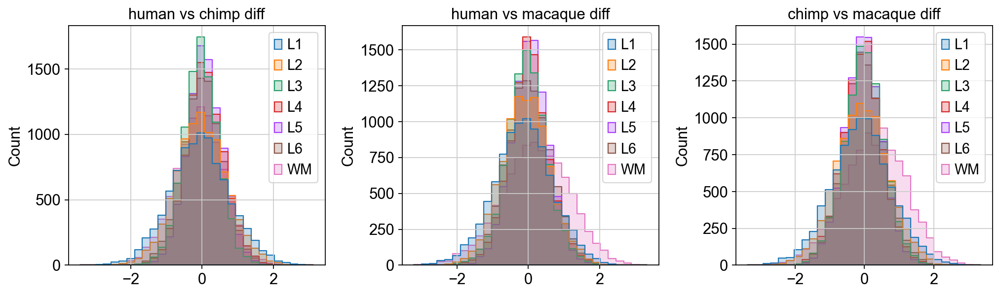

In [16]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [17]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC - ΔHM'] = hum_stack['human_chimp_diff'] - hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM
L1,A1BG,-0.905086,-1.018086,0.113000
L2,A1BG,1.081197,-0.573703,1.654900
L3,A1BG,-0.537651,0.948931,-1.486582
L4,A1BG,-0.221108,0.826215,-1.047323
L5,A1BG,0.084847,0.226093,-0.141246


Add t-test results for ANOVA significant genes

In [18]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,A1BG,-0.905086,-1.018086,0.113000,0.280856,0.339575,0.940987
L2,A1BG,1.081197,-0.573703,1.654900,0.335712,0.555180,0.052087
L3,A1BG,-0.537651,0.948931,-1.486582,0.378553,0.184102,0.040639
L4,A1BG,-0.221108,0.826215,-1.047323,0.709464,0.334743,0.266840
L5,A1BG,0.084847,0.226093,-0.141246,0.945910,0.837651,0.786265


Text(0, 0.5, 'Number of genes')

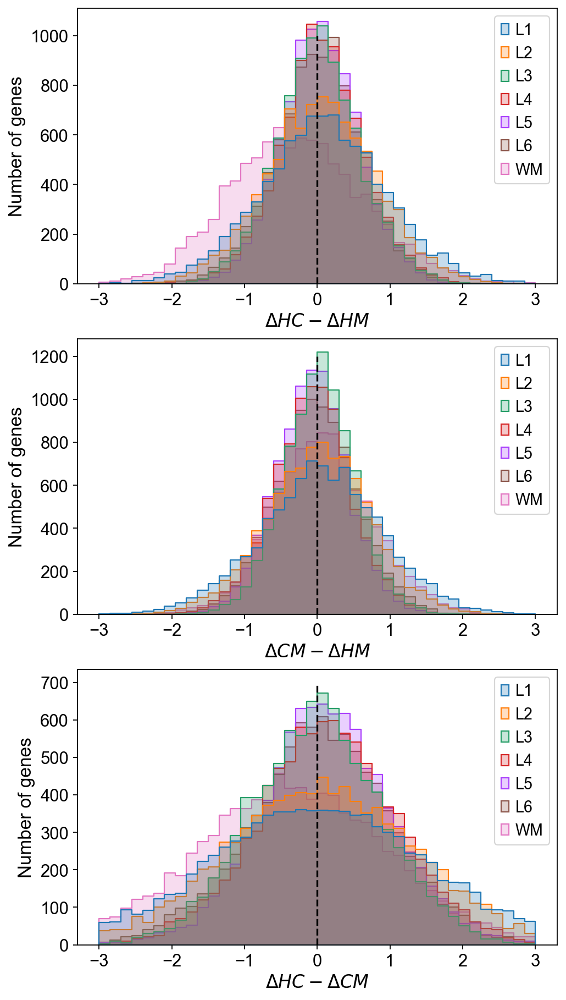

In [19]:
fig, ax = plt.subplots(3, 1, figsize=(7, 14))

data_to_plot = human_chimp_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[0])
ax[0].vlines(0, ymin=0, ymax=1000, colors='black', linestyles='dashed')
ax[0].grid(False)
ax[0].set_xlabel('$\Delta HC - \Delta HM$', fontsize=15)
ax[0].set_ylabel('Number of genes', fontsize=15)

data_to_plot = chimp_macaque_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[1])
ax[1].vlines(0, ymin=0, ymax=1200, colors='black', linestyles='dashed')
ax[1].grid(False)
ax[1].set_xlabel('$\Delta CM - \Delta HM$', fontsize=15)
ax[1].set_ylabel('Number of genes', fontsize=15)

data_to_plot = human_chimp_diff - chimp_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[2])
ax[2].vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax[2].grid(False)
ax[2].set_xlabel('$\Delta HC - \Delta CM$', fontsize=15)
ax[2].set_ylabel('Number of genes', fontsize=15)

## Filter specie-specific profiles

### Let's explore

In [20]:
#human_chimp_diff, human_macaque_diff, chimp_macaque_diff

In [21]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

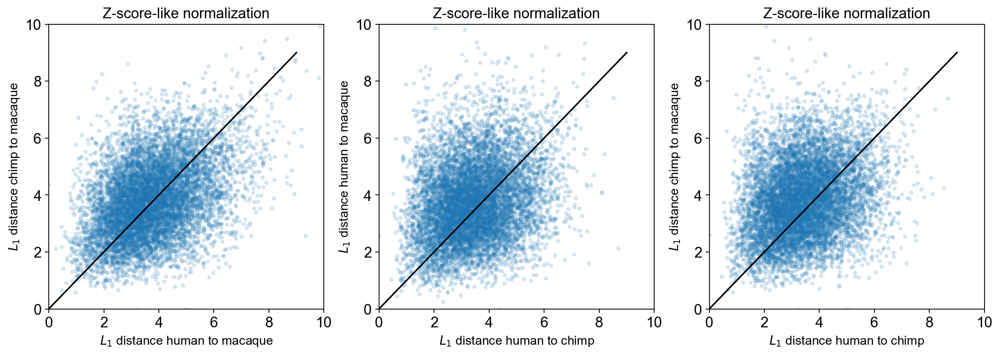

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].plot(hm_l1, cm_l1, '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].plot(hc_l1, hm_l1, '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].plot(hc_l1, cm_l1, '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Z-score-like normalization')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

In [23]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

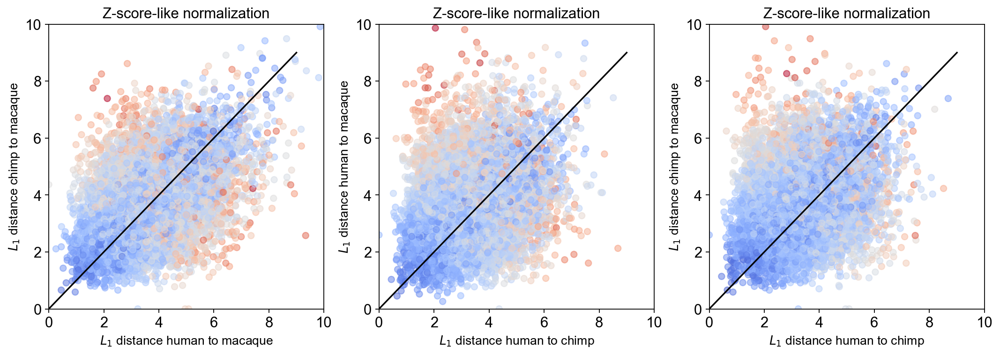

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].scatter(hm_l1, cm_l1, alpha=0.5, c=hc_l1, cmap='coolwarm')
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].scatter(hc_l1, hm_l1, alpha=0.5, c=cm_l1, cmap='coolwarm')
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].scatter(hc_l1, cm_l1, alpha=0.5, c=hm_l1, cmap='coolwarm')
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Z-score-like normalization')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

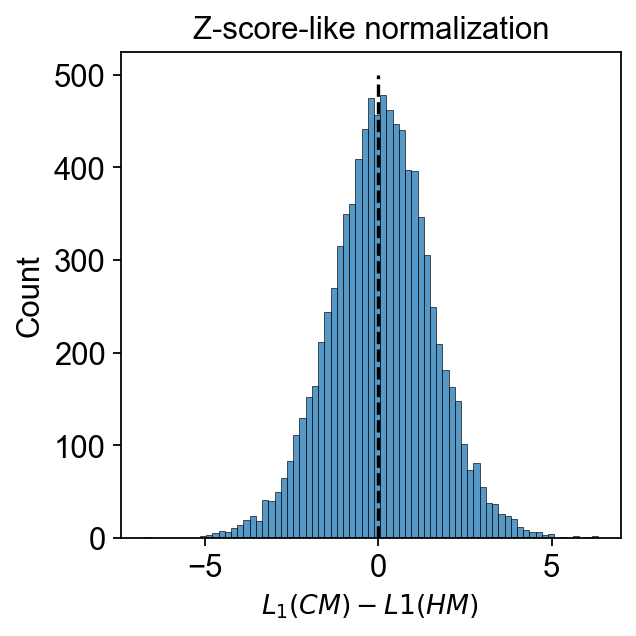

In [25]:
sns.histplot(cm_l1 - hm_l1)
plt.vlines(0, ymin=0, ymax=500, colors='black', linestyles='dashed')
plt.title('Z-score-like normalization')
plt.xlabel('$L_1(CM) - L1(HM)$ ', fontsize=12)
plt.grid(False)

In [26]:
((cm_l1 - hm_l1) < 0).sum(), ((cm_l1 - hm_l1) > 0).sum()

(4319, 4888)

### Human-specific

Filter genes:
$$
L_1(HM) > L_1(CM)
$$

and

$$
L_1(HC) >= q
$$

In [27]:
quantile = 0.95
quant_value = hc_l1.quantile(quantile)
quant_value

5.61586537361145

Text(0.5, 1.0, '$L_1$ distance human vs chimp')

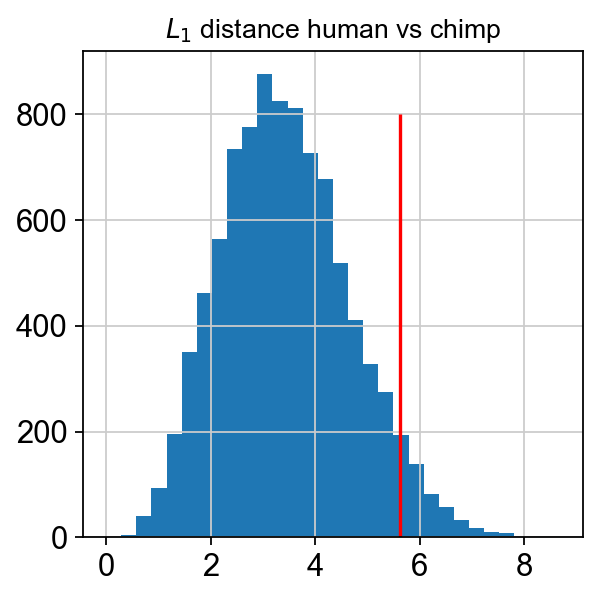

In [28]:
plt.vlines(quant_value, ymin=0, ymax=800,colors='red')
hc_l1.hist(bins=30)
plt.title('$L_1$ distance human vs chimp', fontsize=12)

In [29]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [30]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['ABHD11', 'ABL2', 'ACSL4', 'ADGRB3', 'AGGF1', 'AMZ2', 'ANKRD11',
       'ANKS1B', 'APBB2', 'APIP',
       ...
       'VTI1B', 'XPR1', 'YIPF5', 'ZBTB46', 'ZCCHC14', 'ZCCHC17', 'ZDHHC1',
       'ZEB2', 'ZMYND8', 'ZNF382'],
      dtype='object', length=224)

### Chimp-specific

In [31]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [32]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes

Index(['ABI3BP', 'ACHE', 'ACTL6B', 'ACTN2', 'ADCYAP1R1', 'ADD2', 'AGL',
       'AKIP1', 'ALG6', 'ALKBH5',
       ...
       'VWA5A', 'VWC2', 'WDR37', 'YPEL5', 'ZBTB38', 'ZNF146', 'ZNF22',
       'ZNF420', 'ZNF771', 'ZSWIM6'],
      dtype='object', length=237)

### Macaque-specific

In [33]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

915

In [34]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['AARS1', 'ABAT', 'ABR', 'ACAD9', 'ACADSB', 'ACTN1', 'ACTN4', 'ADAM11',
       'ADAM19', 'ADIRF',
       ...
       'ZDHHC12', 'ZDHHC22', 'ZHX3', 'ZNF277', 'ZNF304', 'ZNF398', 'ZNF462',
       'ZNF581', 'ZNF655', 'ZNF768'],
      dtype='object', length=578)

### Compare a number of human-specific vs chimp-specific

In [35]:
qv_list = np.linspace(5, 10)
hs_num = []
cs_num = []
ms_num = []
quant_list = [0.8, 0.85, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99, 0.995, 0.999]
for qv in qv_list:
    #qv = hc_l1.quantile(q)
    # hs
    gene_filter1 = (hm_l1 > cm_l1)
    gene_filter2 = (hc_l1 >= qv)
    hs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # cs
    gene_filter1 = (cm_l1 > hm_l1)
    gene_filter2 = (hc_l1 >= qv)
    cs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # ms
    gene_filter1 = (hm_l1 > hc_l1)
    gene_filter2 = (cm_l1 >= qv)
    ms_num.append(hm_l1[(gene_filter1) & (gene_filter2)].index.size)

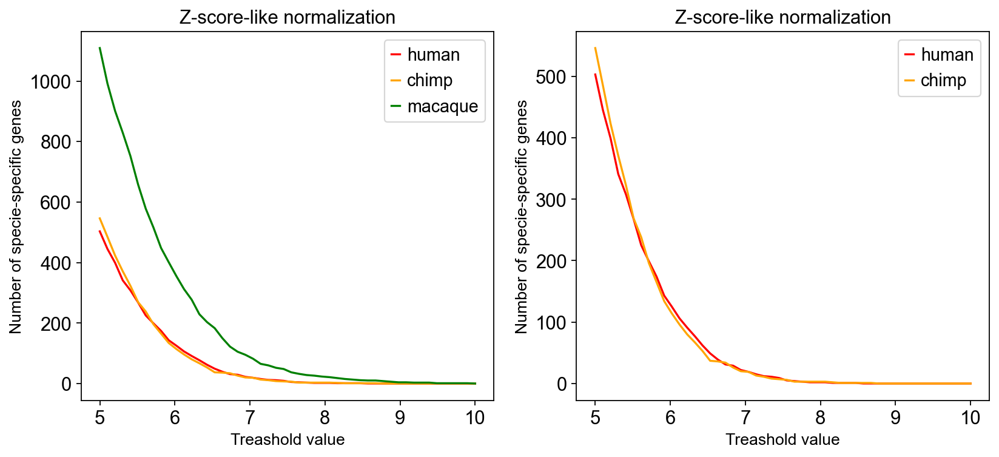

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(qv_list, hs_num, 'r-')
ax[0].plot(qv_list, cs_num, '-', c='orange')
ax[0].plot(qv_list, ms_num, '-', c='green')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[0].legend(['human', 'chimp', 'macaque'])
ax[0].grid(False)

ax[1].plot(qv_list, hs_num, 'r-')
ax[1].plot(qv_list, cs_num, '-', c='orange')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[1].legend(['human', 'chimp', 'macaque'])
ax[1].grid(False)

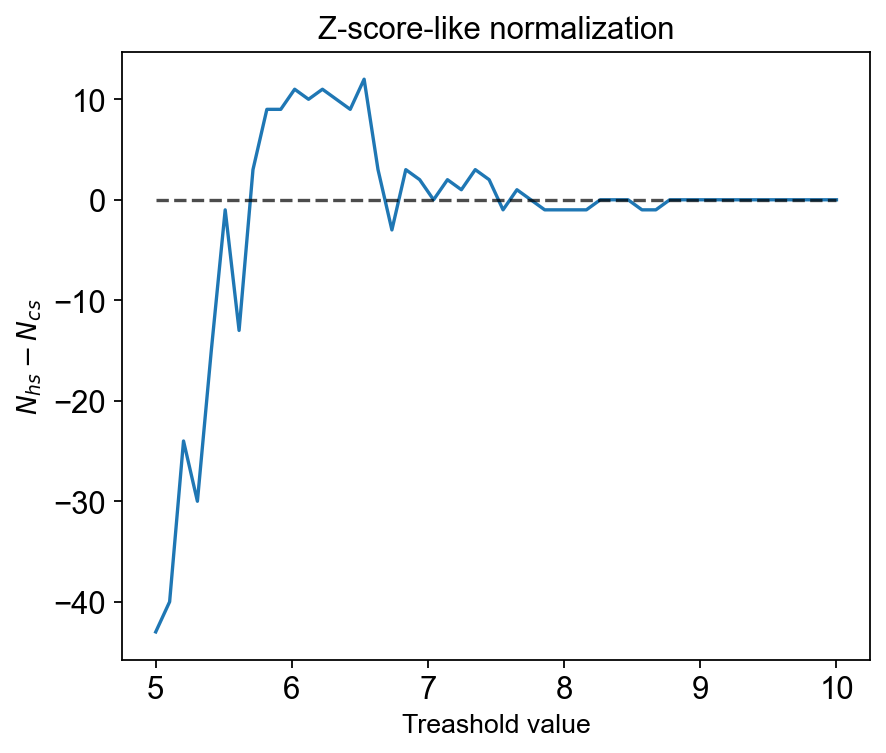

In [37]:
fig, ax = plt.subplots(figsize=(6, 5))
plt.plot(qv_list, np.array(hs_num) - np.array(cs_num), '-')
plt.hlines(0, xmin=5, xmax=10, colors='black', linestyles='dashed', alpha=0.7)
plt.title('Z-score-like normalization')
plt.xlabel('Treashold value', fontsize=12)
plt.ylabel('$N_{hs} - N_{cs}$', fontsize=12)
plt.grid(False)

# Normalization on average

## Calculate differencies

In [38]:
adata_pb_norm_mean[(adata_pb_norm_mean.obs.condition == 'human') & (adata_pb_norm_mean.obs.layer == 'L1')].obs

,layer,sample_id,psbulk_n_cells,psbulk_counts,condition,lib_size,log_lib_size
human_759_L1,L1,human_759,500.0,961453.0,human,1922.906006,7.561593
human_j12_L1,L1,human_j12,331.0,827957.0,human,2501.380859,7.824598
human_j3_L1,L1,human_j3,110.0,378096.0,human,3437.236328,8.142423
human_j4_L1,L1,human_j4,238.0,770218.0,human,3236.209961,8.082158
human_j6_L1,L1,human_j6,134.0,255642.0,human,1907.776123,7.553693


In [39]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm_mean.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm_mean[(adata_pb_norm_mean.obs.condition == specie) &
                                                       (adata_pb_norm_mean.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [40]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

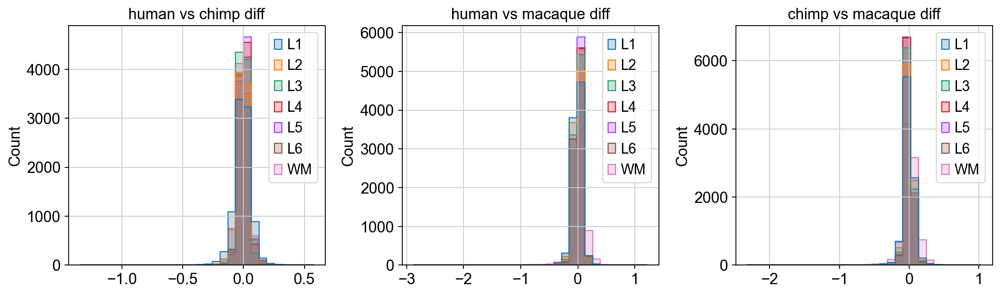

In [41]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [42]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC - ΔHM'] = hum_stack['human_chimp_diff'] - hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM
L1,A1BG,-0.129611,-0.119918,-0.009692
L2,A1BG,0.063512,0.017036,0.046476
L3,A1BG,0.003279,0.086647,-0.083367
L4,A1BG,0.033007,0.104219,-0.071212
L5,A1BG,0.019440,0.012901,0.006539


Add t-test results for ANOVA significant genes

In [43]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,A1BG,-0.129611,-0.119918,-0.009692,0.280856,0.339575,0.940987
L2,A1BG,0.063512,0.017036,0.046476,0.335712,0.555180,0.052087
L3,A1BG,0.003279,0.086647,-0.083367,0.378553,0.184102,0.040639
L4,A1BG,0.033007,0.104219,-0.071212,0.709464,0.334743,0.266840
L5,A1BG,0.019440,0.012901,0.006539,0.945910,0.837651,0.786265


Text(0, 0.5, 'Number of genes')

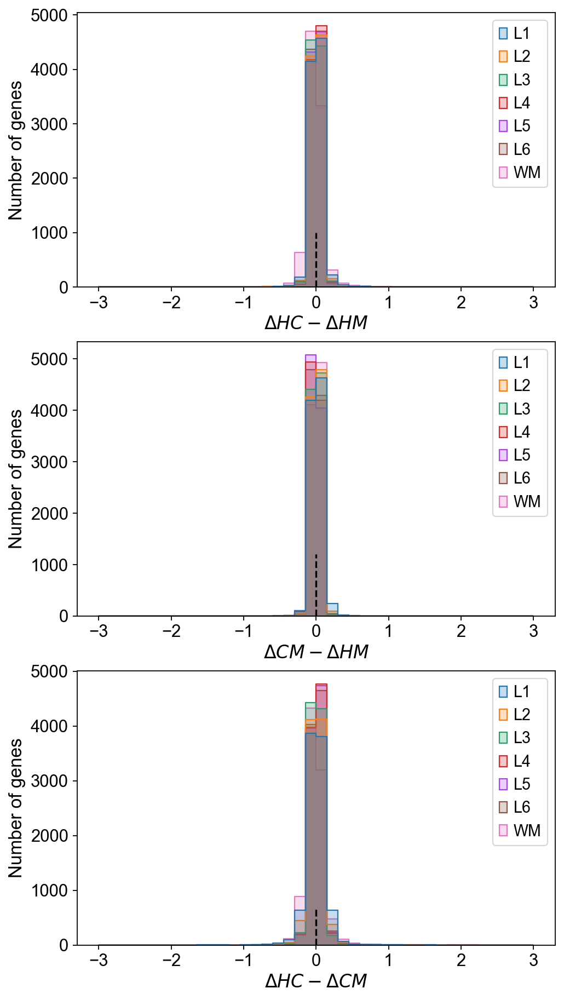

In [44]:
fig, ax = plt.subplots(3, 1, figsize=(7, 14))

data_to_plot = human_chimp_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[0])
ax[0].vlines(0, ymin=0, ymax=1000, colors='black', linestyles='dashed')
ax[0].grid(False)
ax[0].set_xlabel('$\Delta HC - \Delta HM$', fontsize=15)
ax[0].set_ylabel('Number of genes', fontsize=15)

data_to_plot = chimp_macaque_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[1])
ax[1].vlines(0, ymin=0, ymax=1200, colors='black', linestyles='dashed')
ax[1].grid(False)
ax[1].set_xlabel('$\Delta CM - \Delta HM$', fontsize=15)
ax[1].set_ylabel('Number of genes', fontsize=15)

data_to_plot = human_chimp_diff - chimp_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[2])
ax[2].vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax[2].grid(False)
ax[2].set_xlabel('$\Delta HC - \Delta CM$', fontsize=15)
ax[2].set_ylabel('Number of genes', fontsize=15)

## Filter specie-specific profiles

### Let's explore

In [45]:
#human_chimp_diff, human_macaque_diff, chimp_macaque_diff

In [46]:
hc_l1_mean = human_chimp_diff.abs().sum(axis=1)
hm_l1_mean = human_macaque_diff.abs().sum(axis=1)
cm_l1_mean = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

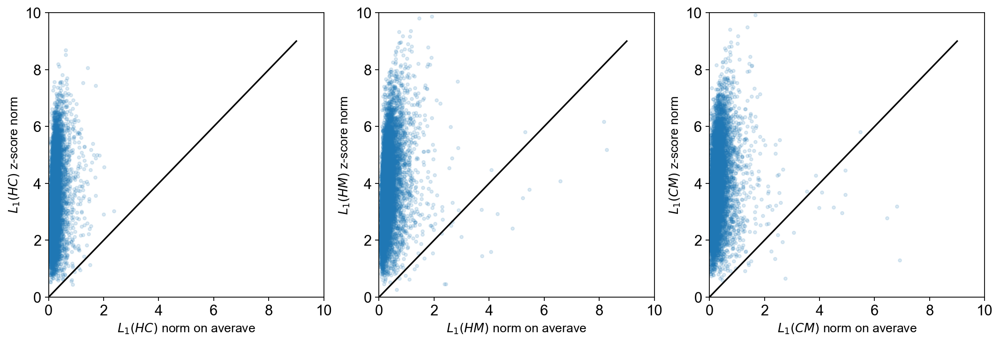

In [47]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))
intersect = hc_l1_mean.index.intersection(hc_l1.index)

ax[0].plot(hc_l1_mean.loc[intersect], hc_l1.loc[intersect], '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
#ax[0].set_title('Normalization on average')
ax[0].set_xlabel('$L_1(HC)$ norm on averave', fontsize=12)
ax[0].set_ylabel('$L_1(HC)$ z-score norm', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].plot(hm_l1_mean.loc[intersect], hm_l1.loc[intersect], '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
#ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1(HM)$ norm on averave', fontsize=12)
ax[1].set_ylabel('$L_1(HM)$ z-score norm', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].plot(cm_l1_mean.loc[intersect], cm_l1.loc[intersect], '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
#ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1(CM)$ norm on averave', fontsize=12)
ax[2].set_ylabel('$L_1(CM)$ z-score norm', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

(0.0, 8.0)

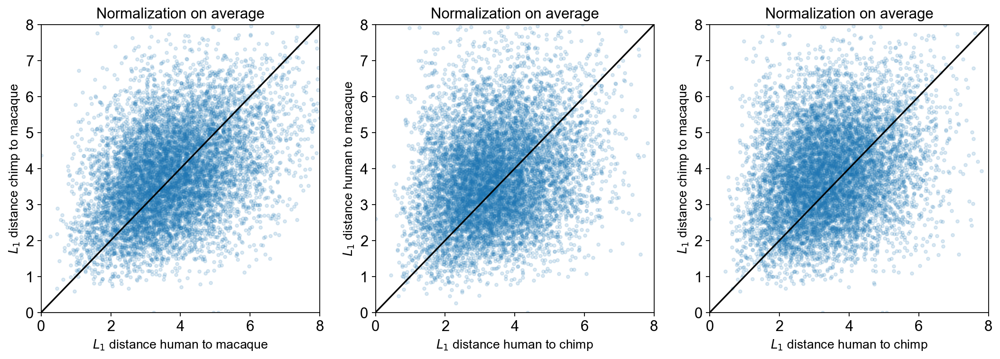

In [48]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].plot(hm_l1, cm_l1, '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 8)
ax[0].set_ylim(0, 8)

ax[1].plot(hc_l1, hm_l1, '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 8)
ax[1].set_ylim(0, 8)

ax[2].plot(hc_l1, cm_l1, '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 8)
ax[2].set_ylim(0, 8)

In [49]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 8.0)

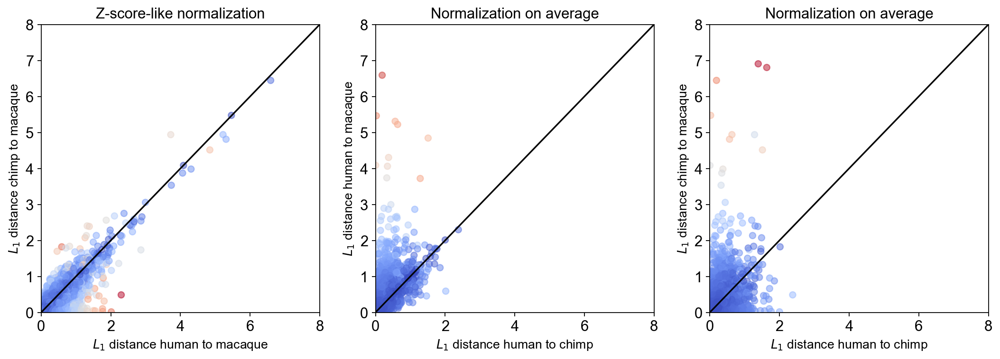

In [50]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].scatter(hm_l1, cm_l1, alpha=0.5, c=hc_l1, cmap='coolwarm')
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 8)
ax[0].set_ylim(0, 8)

ax[1].scatter(hc_l1, hm_l1, alpha=0.5, c=cm_l1, cmap='coolwarm')
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 8)
ax[1].set_ylim(0, 8)

ax[2].scatter(hc_l1, cm_l1, alpha=0.5, c=hm_l1, cmap='coolwarm')
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 8)
ax[2].set_ylim(0, 8)

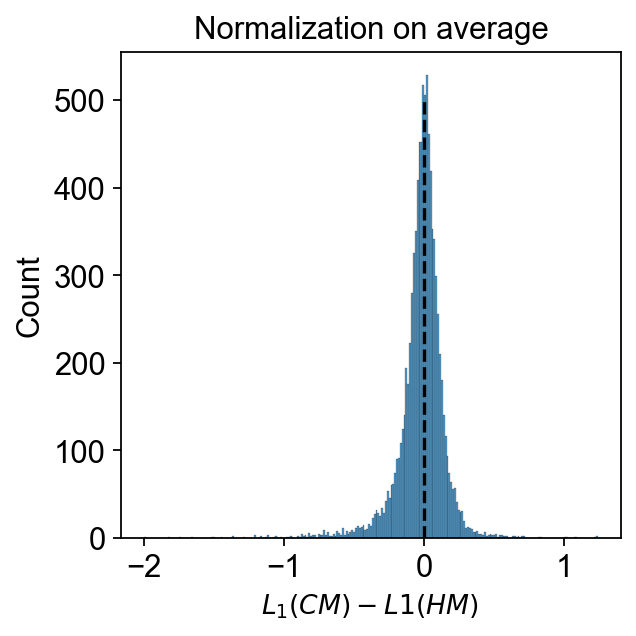

In [51]:
sns.histplot(cm_l1 - hm_l1)
plt.vlines(0, ymin=0, ymax=500, colors='black', linestyles='dashed')
plt.title('Normalization on average')
plt.xlabel('$L_1(CM) - L1(HM)$ ', fontsize=12)
plt.grid(False)

In [52]:
((cm_l1 - hm_l1) < 0).sum(), ((cm_l1 - hm_l1) > 0).sum()

(4719, 4488)

### Human-specific

Filter genes:
$$
L_1(HM) > L_1(CM)
$$

and

$$
L_1(HC) >= q
$$

In [53]:
quantile = 0.95
quant_value = hc_l1.quantile(quantile)
quant_value

0.5346964389085769

Text(0.5, 1.0, '$L_1$ distance human vs chimp')

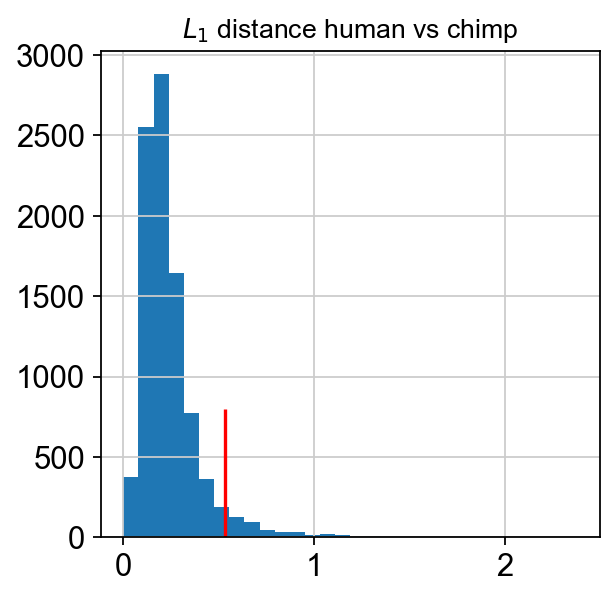

In [54]:
plt.vlines(quant_value, ymin=0, ymax=800,colors='red')
hc_l1.hist(bins=30)
plt.title('$L_1$ distance human vs chimp', fontsize=12)

In [55]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [56]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['ACSL4', 'ACTA2', 'ADCY1', 'ADD2', 'ADGRB3', 'ADRA2A', 'AGAP1',
       'AKR1C2', 'AKT3', 'ALCAM',
       ...
       'UST', 'VAT1L', 'VSTM2A', 'XKR4', 'XPR1', 'ZBTB18', 'ZBTB20', 'ZBTB34',
       'ZMYND8', 'ZNF385D'],
      dtype='object', length=324)

### Chimp-specific

In [57]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [58]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes

Index(['ACTN2', 'AGT', 'AHNAK', 'B2M', 'B3GALT2', 'BAIAP2', 'BRINP3', 'CA10',
       'CALB2', 'CBLN2',
       ...
       'TIMP3', 'TNC', 'TSC22D4', 'TTC9B', 'TXNIP', 'UBE2QL1', 'VIM', 'VWF',
       'WASF1', 'WLS'],
      dtype='object', length=137)

### Macaque-specific

In [59]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

1164

In [60]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['AATK', 'ABAT', 'ABCA2', 'ABCD4', 'ABHD17B', 'ACAD10', 'ACADVL',
       'ACBD7', 'ACSBG1', 'ACSL1',
       ...
       'ZEB2', 'ZFAND3', 'ZFP36L1', 'ZFP36L2', 'ZIC2', 'ZMAT2', 'ZNF184',
       'ZNF483', 'ZNF536', 'ZNF664'],
      dtype='object', length=997)

### Compare a number of human-specific vs chimp-specific

In [61]:
qv_list = np.linspace(0, 4, 100)
hs_num = []
cs_num = []
ms_num = []
quant_list = [0.8, 0.85, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99, 0.995, 0.999]
for qv in qv_list:
    #qv = hc_l1.quantile(q)
    # hs
    gene_filter1 = (hm_l1 > cm_l1)
    gene_filter2 = (hc_l1 >= qv)
    hs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # cs
    gene_filter1 = (cm_l1 > hm_l1)
    gene_filter2 = (hc_l1 >= qv)
    cs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # ms
    gene_filter1 = (hm_l1 > hc_l1)
    gene_filter2 = (cm_l1 >= qv)
    ms_num.append(hm_l1[(gene_filter1) & (gene_filter2)].index.size)

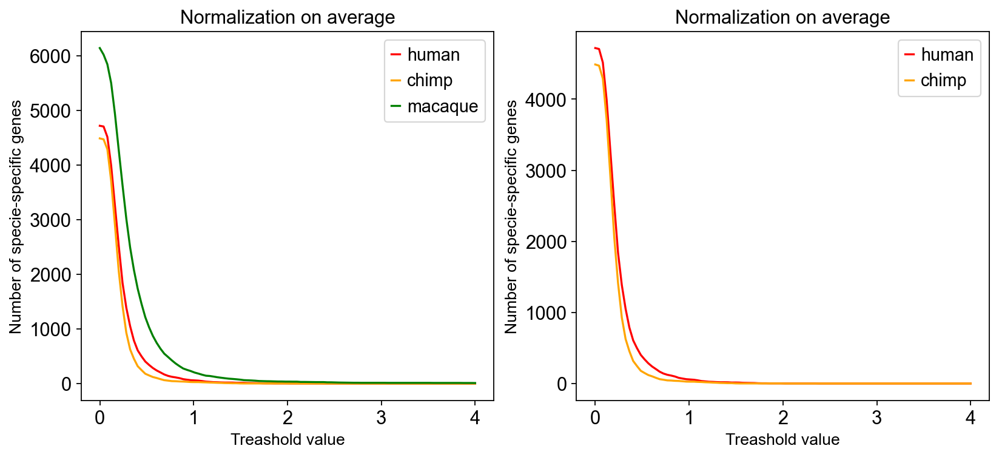

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(qv_list, hs_num, 'r-')
ax[0].plot(qv_list, cs_num, '-', c='orange')
ax[0].plot(qv_list, ms_num, '-', c='green')
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[0].legend(['human', 'chimp', 'macaque'])
ax[0].grid(False)

ax[1].plot(qv_list, hs_num, 'r-')
ax[1].plot(qv_list, cs_num, '-', c='orange')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[1].legend(['human', 'chimp', 'macaque'])
ax[1].grid(False)

treshold = 0.7676767676767677


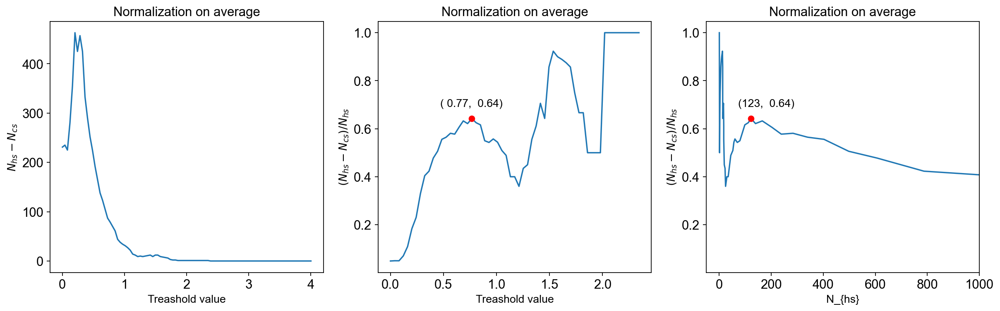

In [63]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (hs_num != 0)
ratio = (hs_num[nonzero] - cs_num[nonzero]) / hs_num[nonzero]
ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
qv_loc_max = qv_list_num[ratio_loc_max_idx]
print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$(N_{hs} - N_{cs}) / N_{hs}$', fontsize=12)
ax[1].grid(False)

ax[2].plot(hs_num[nonzero], ratio, '-')
ax[2].plot([hs_num[ratio_loc_max_idx]], [ratio[ratio_loc_max_idx]], 'ro')
ax[2].text(hs_num[ratio_loc_max_idx] - 50, ratio[ratio_loc_max_idx] + 0.05, f'({hs_num[ratio_loc_max_idx]}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[2].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('N_{hs}', fontsize=12)
ax[2].set_ylabel('$(N_{hs} - N_{cs}) / N_{hs}$', fontsize=12)
ax[2].set_xlim(-50, 1000)
ax[2].grid(False)

In [64]:
ratio

array([0.04895105, 0.04993625, 0.04983389, 0.07015786, 0.10902948,
       0.18351169, 0.23060228, 0.32972583, 0.40437678, 0.42312579,
       0.47775947, 0.5060241 , 0.55583127, 0.56470588, 0.58098592,
       0.57740586, 0.60591133, 0.63253012, 0.62142857, 0.64227642,
       0.625     , 0.61616162, 0.55      , 0.54285714, 0.55737705,
       0.54385965, 0.50943396, 0.48888889, 0.4       , 0.4       ,
       0.36      , 0.43478261, 0.45      , 0.55555556, 0.61111111,
       0.70588235, 0.64285714, 0.85714286, 0.92307692, 0.9       ,
       0.88888889, 0.875     , 0.85714286, 0.75      , 0.66666667,
       0.66666667, 0.5       , 0.5       , 0.5       , 0.5       ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ])

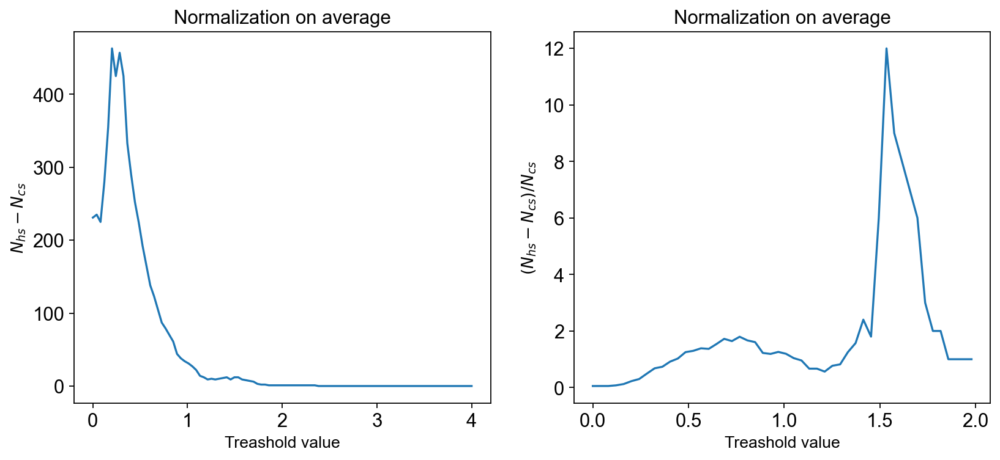

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (cs_num != 0)
ratio = (hs_num[nonzero] - cs_num[nonzero]) / cs_num[nonzero]
#ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
#qv_loc_max = qv_list_num[ratio_loc_max_idx]
#print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
#ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
#ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$(N_{hs} - N_{cs}) / N_{сs}$', fontsize=12)
ax[1].grid(False)

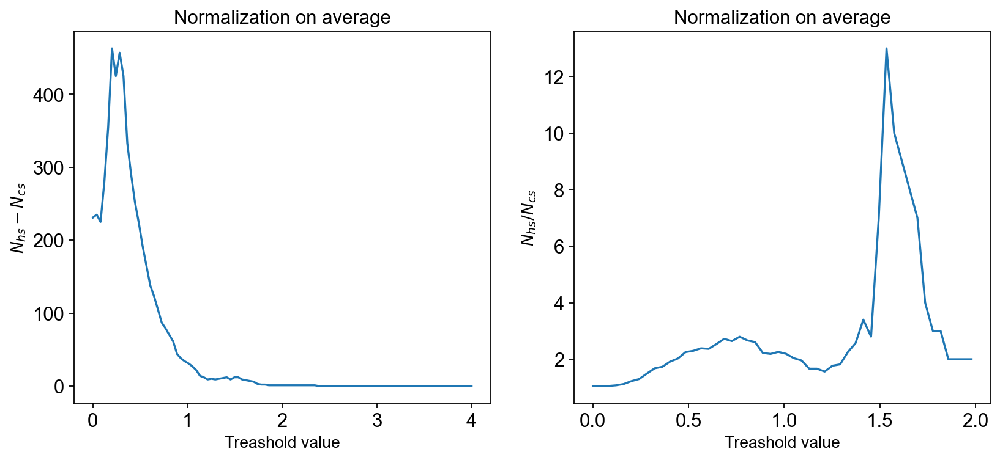

In [66]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (cs_num != 0)
ratio = hs_num[nonzero] / cs_num[nonzero]
#ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
#qv_loc_max = qv_list_num[ratio_loc_max_idx]
#print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
#ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
#ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$N_{hs}/ N_{cs}$', fontsize=12)
ax[1].grid(False)

In [67]:
argmax = ratio[:ratio.size // 2].argmax()
qv_list_num[argmax]

0.7676767676767677

In [68]:
diff = hs_num - cs_num
hs_num[(diff == 457)], cs_num[(diff == 457)]

(array([1386]), array([929]))

## Explore specie-specific genes

### Apply treashold

#### Human-specific

In [69]:
quant_value = qv_loc_max

In [70]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

167

In [71]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['ACTA2', 'ADCY1', 'ADRA2A', 'ALCAM', 'B3GAT2', 'BASP1', 'BPTF',
       'CAMK2N2', 'CCK', 'CDC42EP3',
       ...
       'TAFA2', 'TENM2', 'TOX', 'TOX3', 'TRPM3', 'TTC3', 'UBAP2', 'XKR4',
       'ZBTB18', 'ZBTB20'],
      dtype='object', length=123)

#### Chimp-specific

In [72]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

167

In [73]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes, cs_genes.size

(Index(['ACTN2', 'AGT', 'B3GALT2', 'CALB2', 'CBLN2', 'CELF4', 'CLEC3B', 'CRYAB',
        'CXCL14', 'CYP26A1', 'DYNC1I1', 'EPHA3', 'ETV1', 'GLUL', 'GRIA4', 'ID1',
        'ID3', 'IGFBP5', 'ITM2A', 'MASP1', 'MCUB', 'MLC1', 'MOAP1', 'NELL1',
        'NEUROD6', 'NFIA', 'NPTX1', 'NR4A2', 'QKI', 'RASL11B', 'RELN', 'RPRM',
        'SLC1A2', 'SNORC', 'SPARC', 'SPON1', 'SPP1', 'SST', 'SULF1', 'SV2B',
        'THBS1', 'TIMP3', 'TSC22D4', 'WASF1'],
       dtype='object'),
 44)

#### Macaque-specific

In [74]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

480

In [75]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['AATK', 'ABHD17B', 'ACAD10', 'ACBD7', 'ACTN1', 'ADCYAP1R1', 'ADD3',
       'AGT', 'AIDA', 'AIFM3',
       ...
       'VIM', 'VIT', 'VSNL1', 'VSTM2L', 'VXN', 'WIF1', 'ZCCHC12', 'ZDHHC9',
       'ZFP36L2', 'ZNF483'],
      dtype='object', length=424)

In [76]:
import pickle

genes_dict = {
    'human': hs_genes,
    'chimp': cs_genes,
    'macaque': ms_genes
}
# save all gene lists
with open('results/specie_specific_genes.pkl', 'wb') as f:
    pickle.dump(genes_dict, f)

### Cluster genes

In [77]:
df = pd.DataFrame(adata_pb_norm_mean.X, index=adata_pb_norm_mean.obs_names, columns=adata_pb_norm_mean.var_names)
df.head()

,A1BG,AAAS,AACS,AADAT,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS1,...,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZWILCH,ZYG11B,ZYX,ZZEF1,ZZZ3
chimp_11454_L1,0.005079,0.073186,-0.108424,0.013291,-0.095572,-0.069955,0.114797,0.029699,-0.004369,0.002562,...,0.047432,-0.010286,-0.106296,-0.133235,-0.152825,0.028279,-0.013137,0.022066,-0.128826,0.001813
chimp_13309_L1,-0.014054,-0.035632,-0.004051,-0.002748,0.075461,0.055413,-0.038396,0.008712,0.051290,0.014893,...,0.000000,0.024417,-0.049720,0.024958,-0.182668,-0.016176,-0.005356,-0.000944,-0.092394,0.029591
chimp_j8_L1,0.009907,0.029165,-0.088813,0.001865,0.038888,-0.002917,0.017374,-0.006275,0.011932,0.029188,...,0.000000,-0.001553,0.021254,0.060017,0.032458,-0.003124,-0.003501,-0.004307,0.111807,0.006668
human_759_L1,-0.142812,0.114319,-0.068295,0.029625,-0.090127,-0.167612,0.092342,-0.045720,-0.024548,-0.043530,...,0.008330,0.024852,-0.010275,-0.013808,-0.004590,-0.084963,-0.053720,0.083597,0.012983,0.007762
human_j12_L1,-0.018240,0.003840,-0.116677,-0.055486,-0.000218,-0.126356,0.105158,-0.083792,-0.032703,-0.054107,...,-0.047386,-0.023089,0.074993,0.006322,-0.068134,-0.132802,-0.138752,0.050423,-0.035598,0.056095


In [78]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

### Human

#### Hierarchial clustering

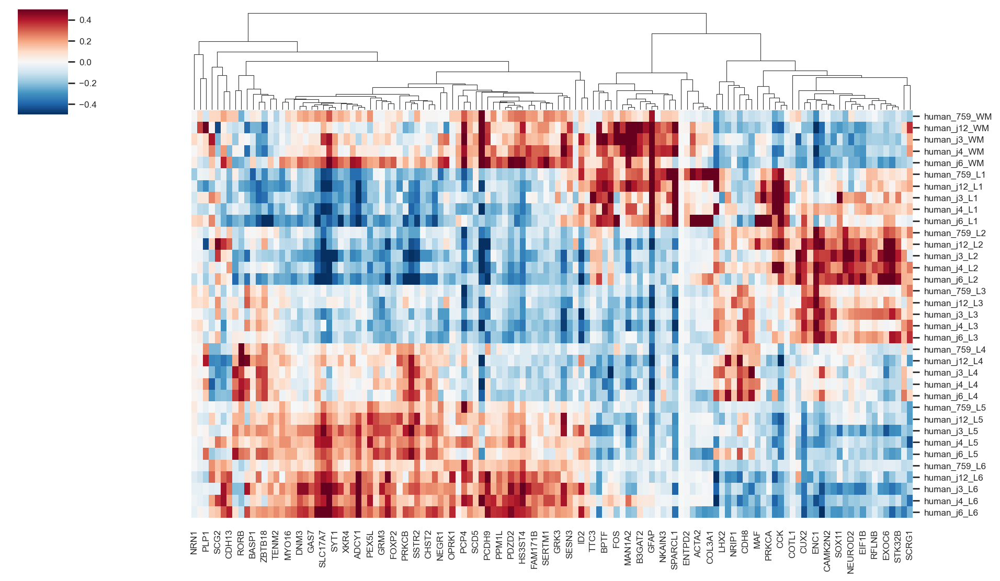

In [79]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[hs_genes].loc[sample_order['human']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

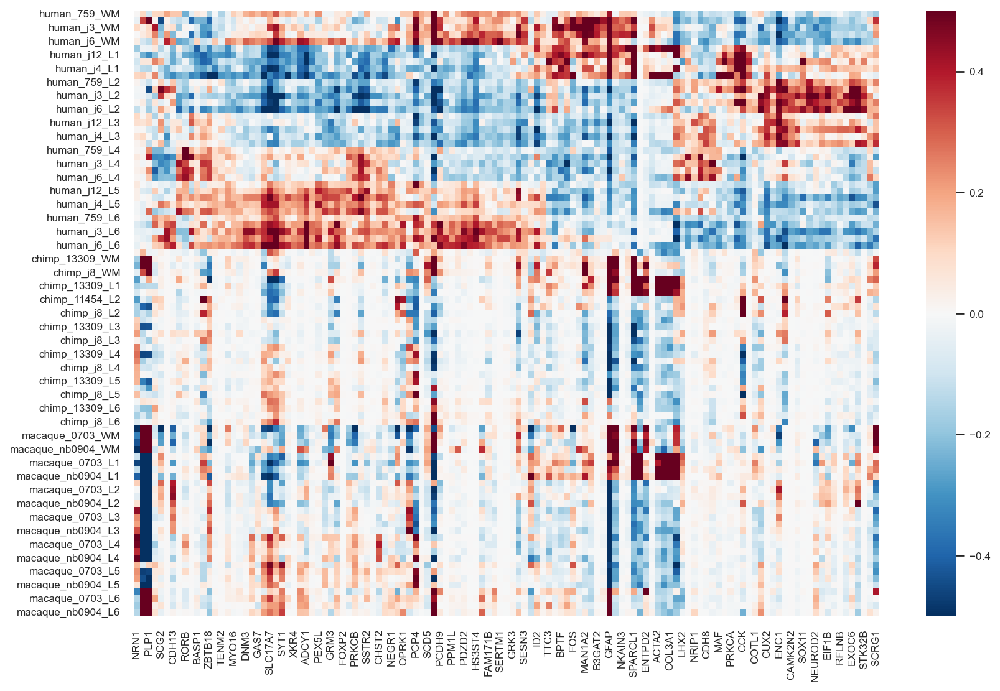

In [80]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = hs_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


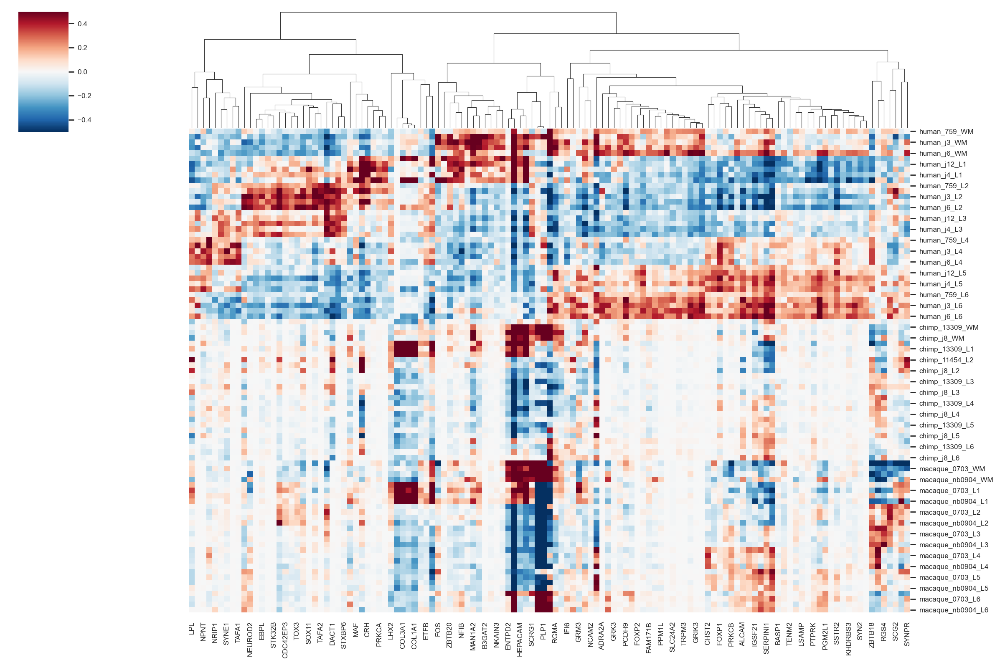

In [81]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[hs_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [82]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hs_genes].loc[sample_order['human']].T, metric='cosine') + 1
n_clusters = 4
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=4,
                   random_state=4)

In [83]:
labels = pd.Series(clustering.labels_, index=hs_genes).sort_values()
order = labels.sort_values().index

<Axes: >

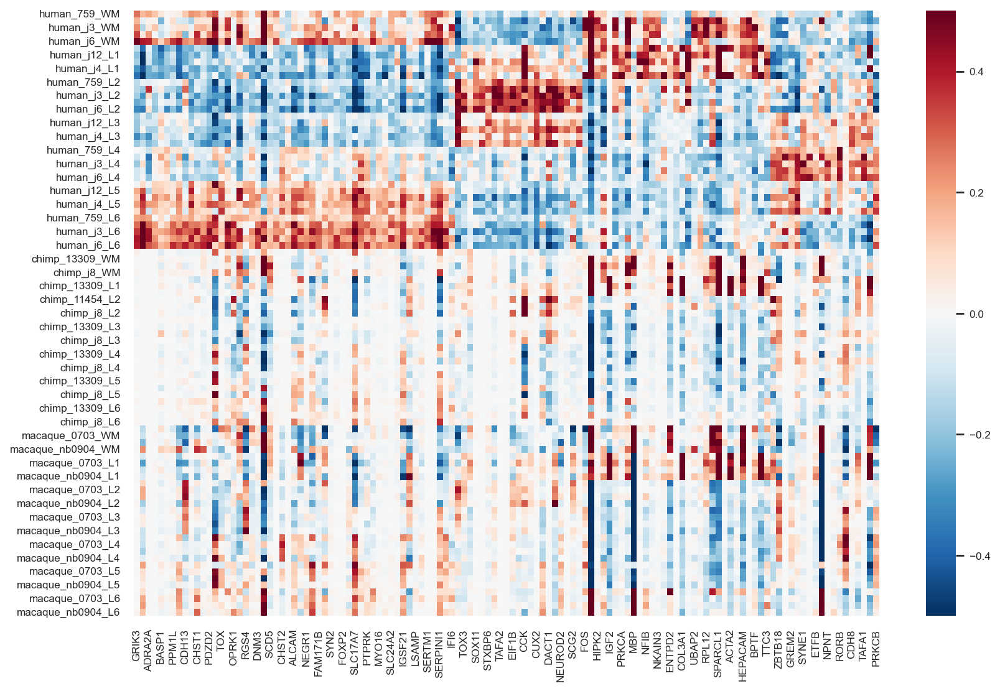

In [84]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [85]:
df_annotation = df[hs_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [86]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ACTA2  ADCY1  ADRA2A     ALCAM    B3GAT2     BASP1  \
condition layer                                                          
chimp     L1     0.728220    0.0     0.0  0.009130  0.037836  0.017949   
          L2    -0.127487    0.0     0.0 -0.242804 -0.020487  0.014213   
          L3    -0.095616    0.0     0.0 -0.066325 -0.013114  0.025171   
          L4    -0.111591    0.0     0.0  0.006249 -0.016708 -0.023246   
          L5    -0.077636    0.0     0.0  0.134409  0.000854 -0.015668   

                     BPTF   CAMK2N2       CCK  CDC42EP3  ...     TAFA2  \
condition layer                                          ...             
chimp     L1     0.035123  0.008391  0.120394  0.006277  ... -0.000658   
          L2     0.002007 -0.002283  0.544792  0.003701  ... -0.000658   
          L3    -0.006032  0.000048  0.075539  0.000524  ...  0.001847   
          L4    -0.000353 -0.001080 -0.380507 -0.002334  ... -0.000493   
          L5    -0.017713  0.000563 -0.238573 -0.003733  ... -0.000493   

                    TENM2           TOX      TOX3     TRPM3      TTC3  \
condition layer                                                         
chimp     L1    -0.005502  3.601114e-08  0.054988 -0.007309  0.146501   
          L2     0.003913 -7.797252e-03  0.059883 -0.011230 -0.025527   
          L3     0.003233 -4.682340e-03 -0.014090 -0.011910 -0.097487   
          L4    -0.000745  5.436148e-03 -0.025821  0.007277 -0.118147   
          L5    -0.001334 -1.703686e-03 -0.010624  0.002446 -0.079551   

                    UBAP2      XKR4    ZBTB18    ZBTB20  
condition layer                                          
chimp     L1     0.001697 -0.002482 -0.154330  0.091287  
          L2     0.053347 -0.002482  0.229193  0.002766  
          L3    -0.041216  0.001612  0.178206 -0.039147  
          L4     0.017843 -0.000726  0.129230 -0.062274  
          L5    -0.056467  0.000668  0.023022 -0.055801  

[5 rows x 123 columns]

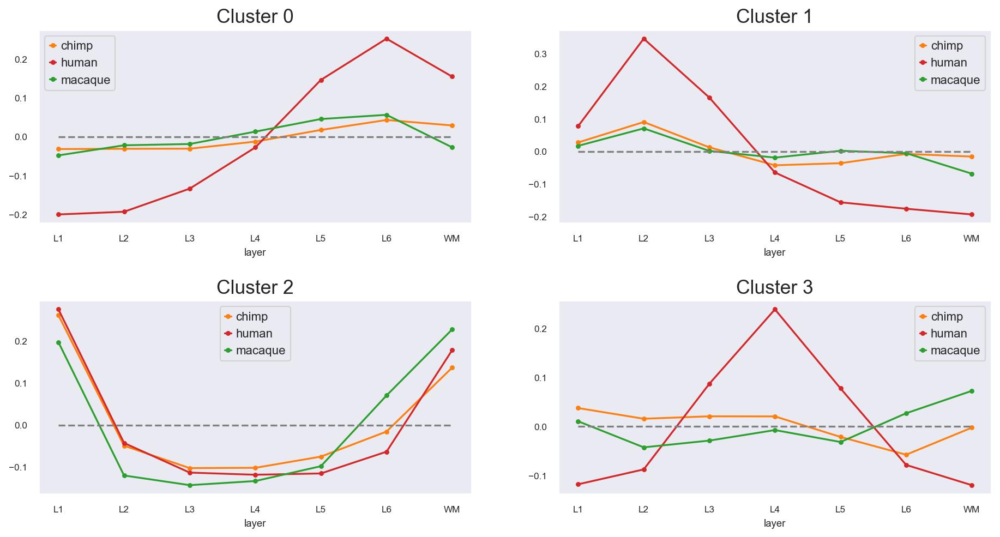

In [87]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### Chimp

#### Hierarchial clustering

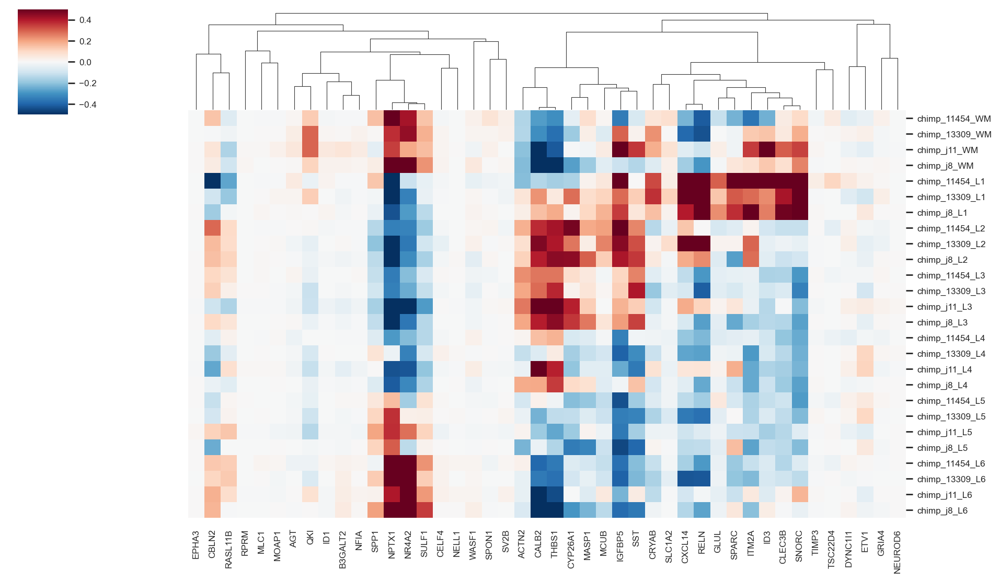

In [88]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[cs_genes].loc[sample_order['chimp']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

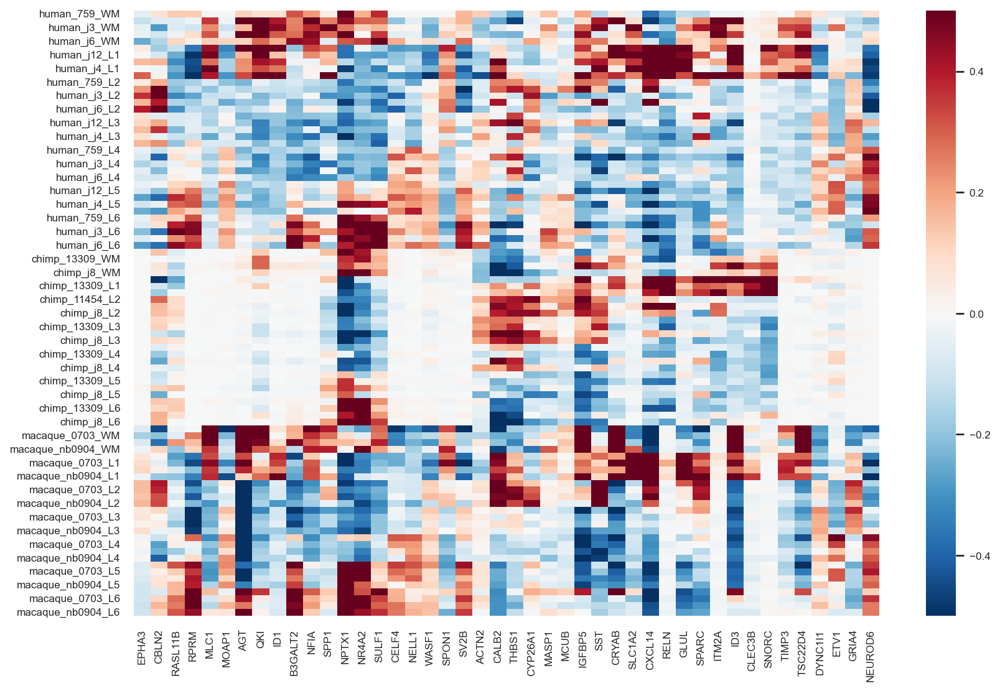

In [89]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = cs_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

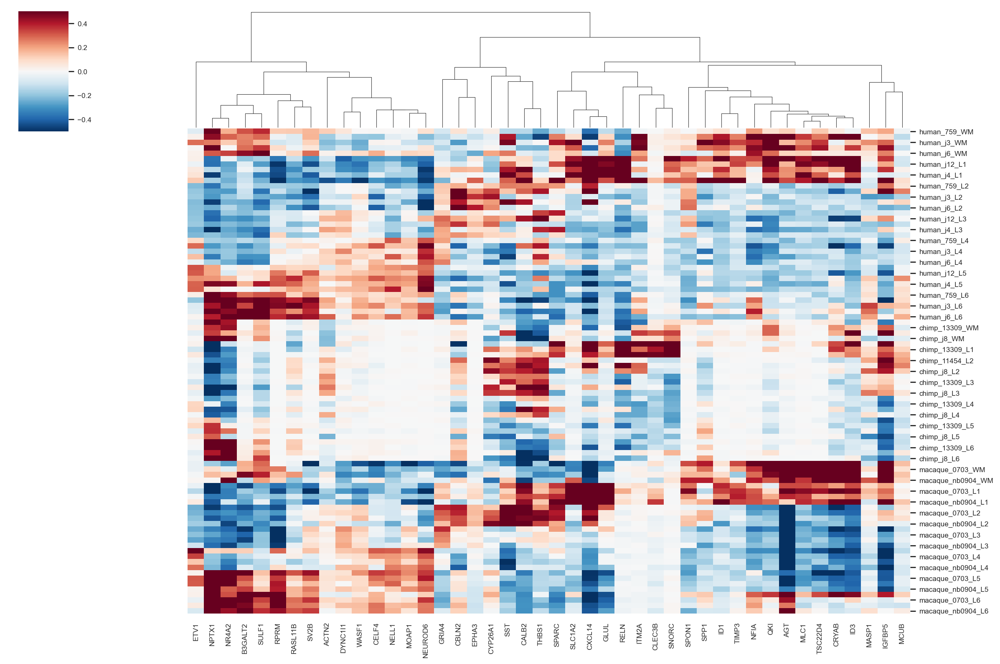

In [90]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[cs_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [91]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[cs_genes].loc[sample_order['chimp']].T, metric='cosine') + 1
n_clusters = 3
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=3,
                   random_state=4)

In [92]:
labels = pd.Series(clustering.labels_, index=cs_genes).sort_values()
order = labels.sort_values().index

<Axes: >

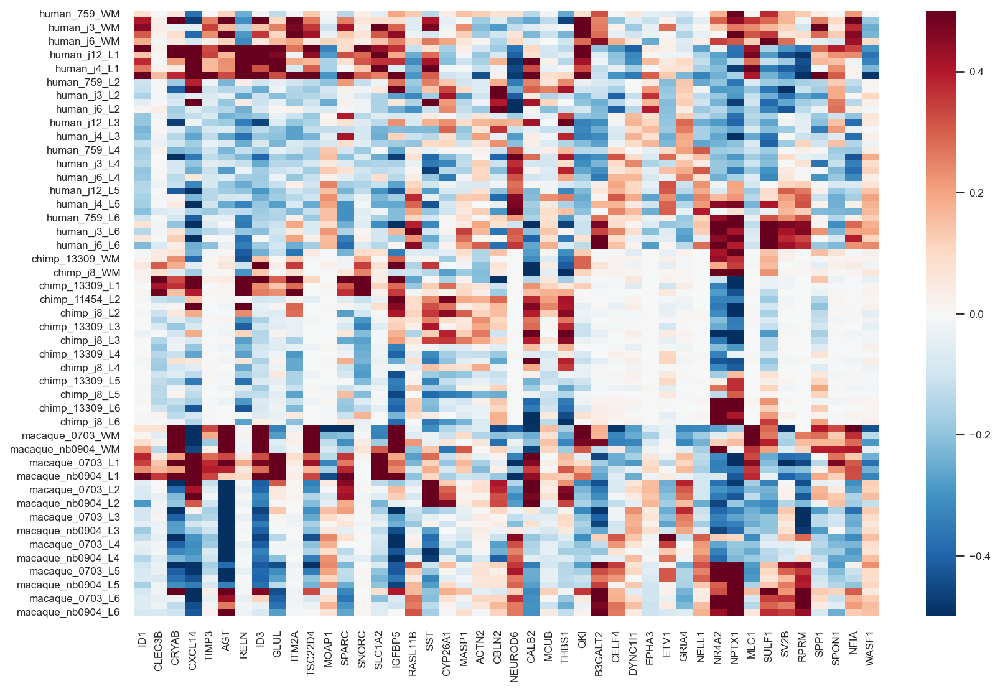

In [93]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [94]:
df_annotation = df[cs_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [95]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ACTN2       AGT   B3GALT2     CALB2     CBLN2     CELF4  \
condition layer                                                               
chimp     L1    -0.037919  0.021529 -0.011758  0.076765 -0.257330 -0.005826   
          L2     0.125905 -0.007189 -0.007582  0.410350  0.197283 -0.020422   
          L3     0.220166 -0.003313 -0.017814  0.422841  0.055974 -0.001741   
          L4     0.011400 -0.015196 -0.015910  0.213624 -0.133812 -0.000294   
          L5    -0.084475 -0.011233 -0.005646 -0.105568 -0.085236 -0.005089   

                   CLEC3B     CRYAB    CXCL14   CYP26A1  ...     SPARC  \
condition layer                                          ...             
chimp     L1     0.525499  0.282525  0.564644  0.046873  ...  0.445502   
          L2    -0.081598 -0.024147  0.418961  0.397523  ... -0.105692   
          L3    -0.094402 -0.094649 -0.025732  0.212771  ... -0.079941   
          L4    -0.171405 -0.038620 -0.111744 -0.087944  ... -0.002207   
          L5    -0.126572 -0.057638 -0.179359 -0.216210  ... -0.008739   

                    SPON1      SPP1       SST     SULF1      SV2B     THBS1  \
condition layer                                                               
chimp     L1    -0.009143  0.030906  0.060971 -0.069200 -0.013757  0.020860   
          L2     0.005613 -0.157574  0.305595 -0.147644 -0.005658  0.423602   
          L3    -0.004785 -0.126055  0.278418 -0.155280 -0.000905  0.458362   
          L4    -0.004662 -0.015556 -0.134193 -0.144975 -0.005921  0.238344   
          L5    -0.005145  0.117140 -0.268711  0.059881 -0.001379 -0.139947   

                    TIMP3   TSC22D4     WASF1  
condition layer                                
chimp     L1     0.013124  0.035697 -0.005009  
          L2    -0.002590 -0.016834 -0.006282  
          L3    -0.000226 -0.005390 -0.025432  
          L4     0.000089 -0.008135  0.008728  
          L5    -0.001387 -0.004862 -0.008279  

[5 rows x 44 columns]

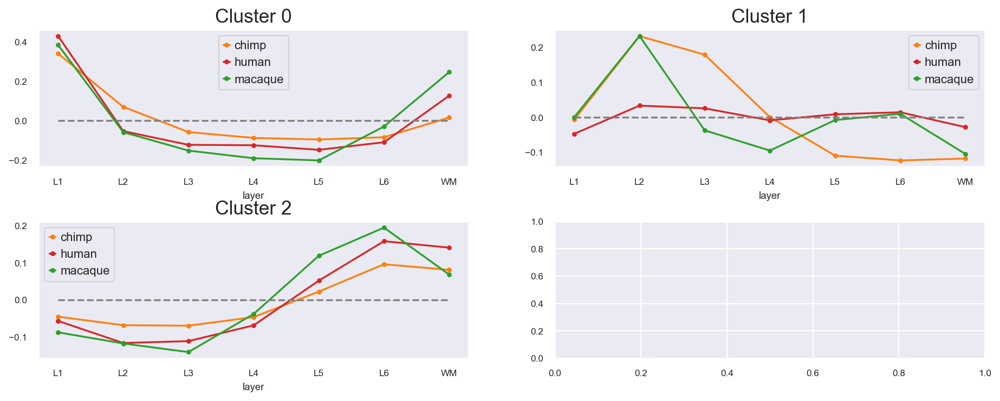

In [96]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### Macaque

#### Hierarchial clustering

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


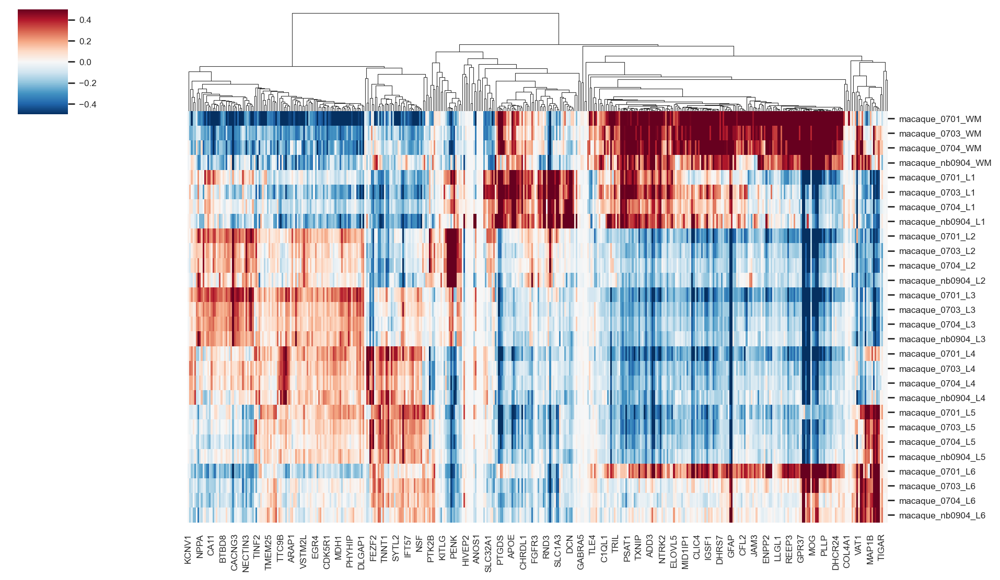

In [97]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[ms_genes].loc[sample_order['macaque']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

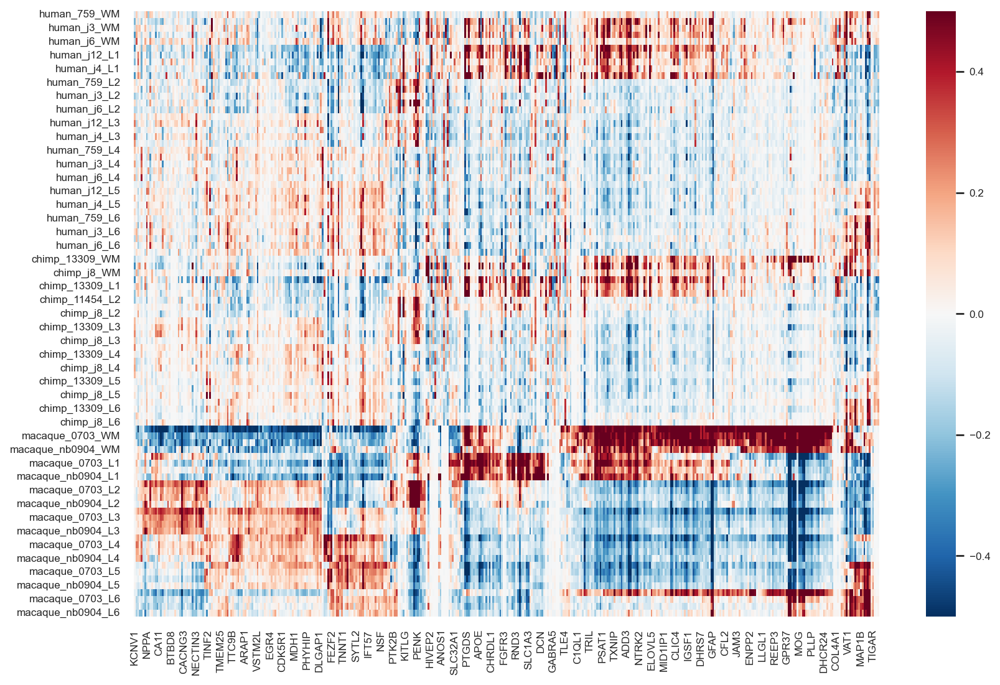

In [98]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = ms_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


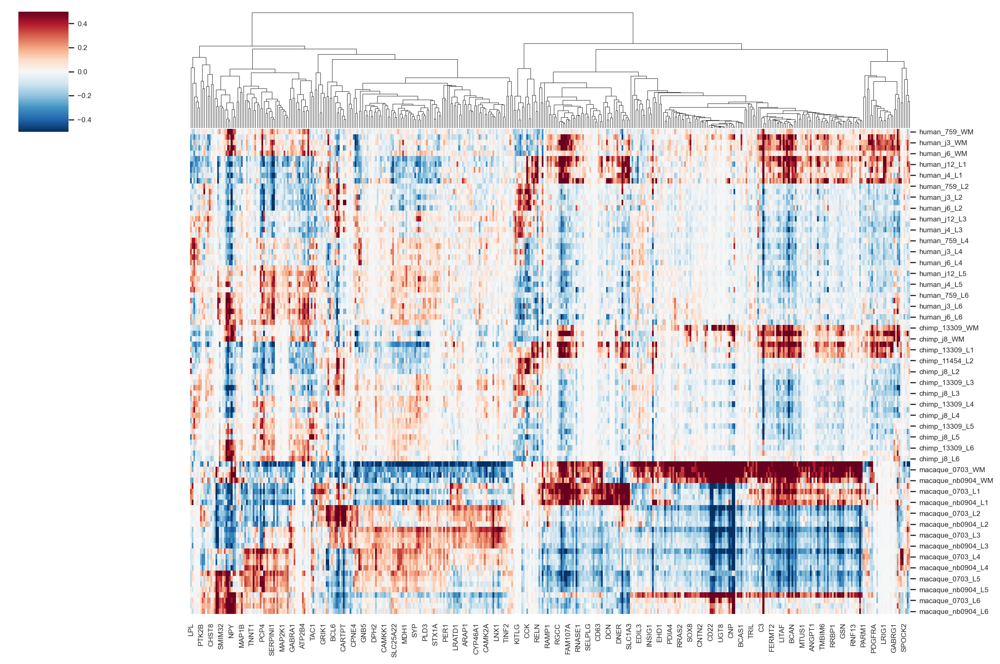

In [99]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[ms_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [100]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[ms_genes].loc[sample_order['macaque']].T, metric='cosine') + 1
n_clusters = 4
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=4,
                   random_state=4)

In [101]:
labels = pd.Series(clustering.labels_, index=ms_genes).sort_values()
order = labels.sort_values().index

<Axes: >

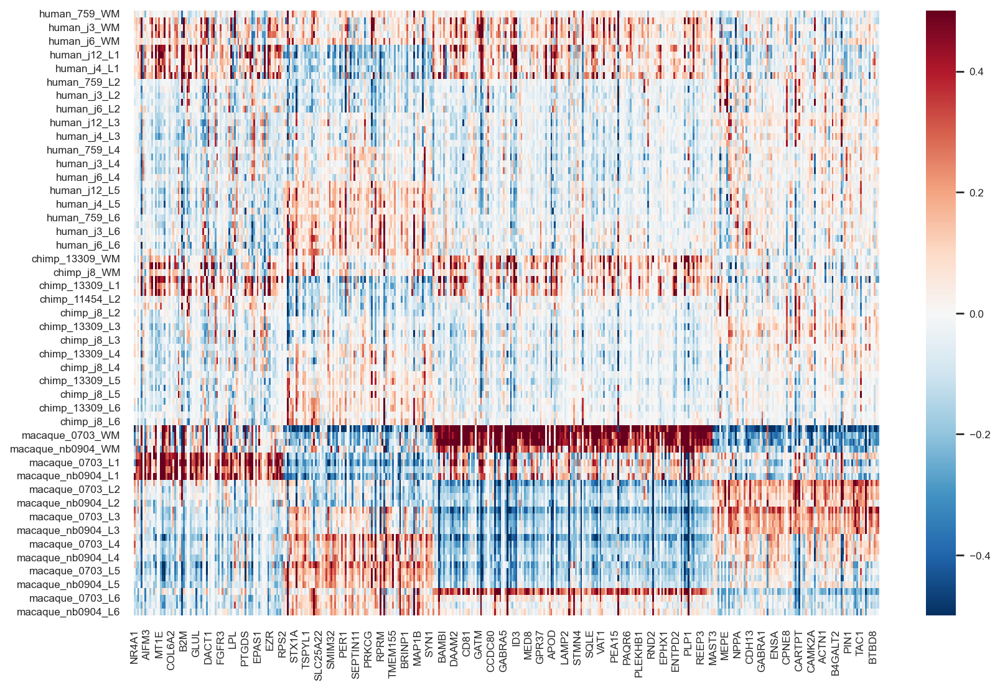

In [102]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [103]:
df_annotation = df[ms_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [104]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AATK   ABHD17B    ACAD10     ACBD7     ACTN1  ADCYAP1R1  \
condition layer                                                                
chimp     L1    -0.030878 -0.001759  0.010473  0.006301 -0.015202  -0.001043   
          L2    -0.065565  0.016788 -0.015965 -0.003049 -0.015137  -0.001043   
          L3    -0.000613 -0.010303 -0.001861 -0.000570  0.002908   0.001164   
          L4     0.005079 -0.004731  0.006279 -0.002516  0.012166   0.001704   
          L5     0.047233 -0.002512 -0.008272  0.001743 -0.007923   0.000260   

                     ADD3       AGT      AIDA     AIFM3  ...       VIM  \
condition layer                                          ...             
chimp     L1     0.432177  0.021529 -0.068123 -0.000345  ...  1.176994   
          L2    -0.107609 -0.007189  0.021937 -0.000345  ... -0.096151   
          L3    -0.223540 -0.003313 -0.001330  0.000418  ... -0.263862   
          L4    -0.219780 -0.015196 -0.024405 -0.000252  ... -0.305315   
          L5    -0.144141 -0.011233  0.016382  0.000692  ... -0.302764   

                      VIT     VSNL1    VSTM2L       VXN      WIF1   ZCCHC12  \
condition layer                                                               
chimp     L1    -0.003224 -0.341156 -0.187876 -0.018511  0.117370 -0.001659   
          L2     0.015092 -0.156568  0.120600  0.008265  0.011345  0.004995   
          L3    -0.003124  0.153015  0.182693  0.002524  0.115427 -0.002203   
          L4    -0.014844  0.179942  0.088341 -0.006386  0.077161 -0.002203   
          L5    -0.000641  0.127961  0.074436 -0.005421 -0.011321  0.001126   

                   ZDHHC9   ZFP36L2    ZNF483  
condition layer                                
chimp     L1    -0.016036  0.272053  0.011409  
          L2    -0.027506 -0.027163 -0.008616  
          L3    -0.028847 -0.119889 -0.002111  
          L4    -0.023085 -0.105188 -0.003121  
          L5    -0.005882 -0.071453 -0.000806  

[5 rows x 424 columns]

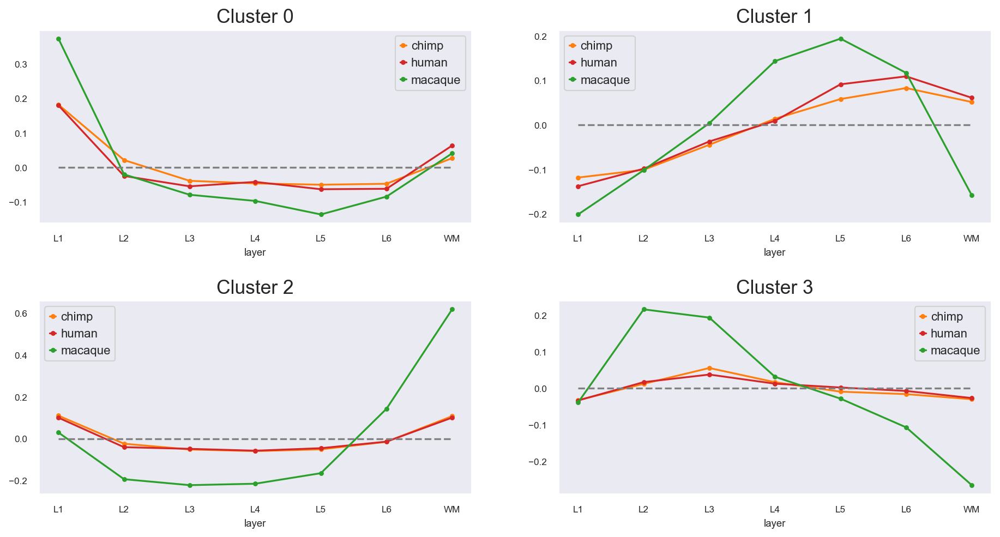

In [105]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

In [106]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [107]:
labels = pd.Series(clustering.labels_, index=df.columns).sort_values()
order = labels.sort_values().index
labels.to_csv('results/mean_norm_clust_allgenes.csv')

<Axes: >

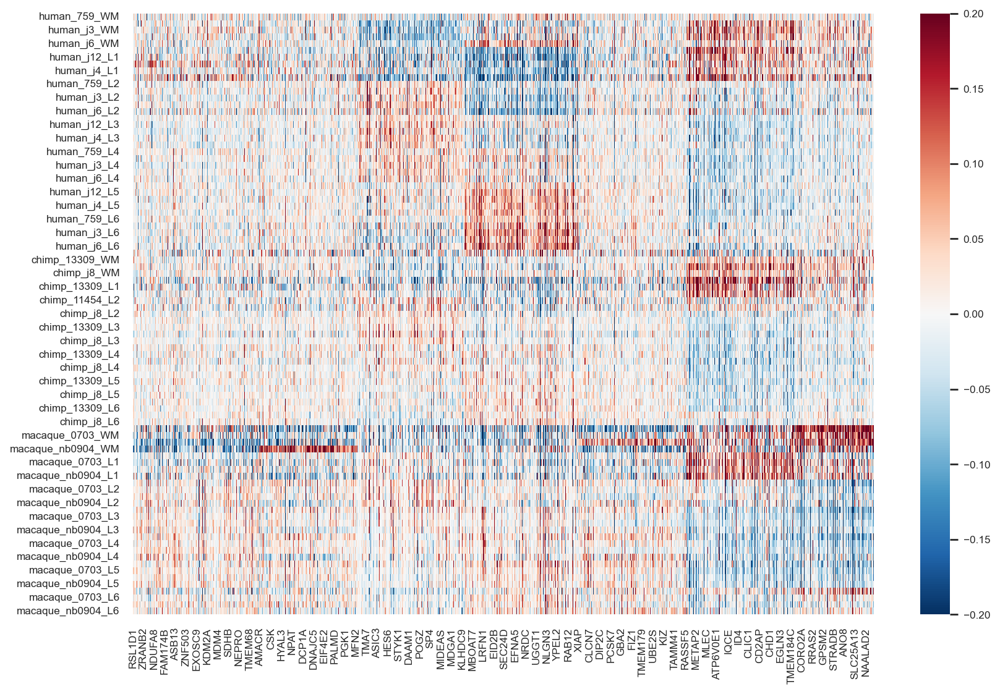

In [108]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.2, vmin=-0.2, center=0)

In [109]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)
df.head()

,A1BG,AAAS,AACS,AADAT,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS1,...,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZWILCH,ZYG11B,ZYX,ZZEF1,ZZZ3
chimp_11454_L1,0.067607,1.677290,-1.534315,0.929936,-1.891263,-1.121907,2.229827,0.418000,-0.182887,0.048899,...,2.267787,-0.605884,-1.395130,-1.446029,-2.058029,0.766767,-0.871571,2.119675,-1.825826,0.044699
chimp_13309_L1,-0.620890,-0.837512,-0.035323,-0.156411,1.389692,0.899977,-1.379352,0.203313,1.537268,0.551155,...,0.000000,2.147622,-0.679872,0.606861,-2.148551,-0.496705,-0.991205,-0.377964,-1.916228,0.735414
chimp_j8_L1,0.180522,1.164353,-0.967539,0.124353,1.043396,-0.044744,0.921149,-0.260578,0.199490,0.714291,...,0.000000,-0.542437,0.406670,1.972330,1.190047,-0.278057,-0.758739,-0.983870,1.912076,0.256580
human_759_L1,-1.331822,2.137584,-1.205822,0.901628,-1.817619,-1.699446,1.991166,-0.914848,-0.788294,-0.647242,...,0.415925,0.461636,-0.452875,-0.346116,-0.100112,-1.887467,-1.363774,1.315433,0.350686,0.344768
human_j12_L1,-0.233744,0.324173,-2.036622,-0.808470,-0.009232,-1.925505,1.342983,-1.619777,-1.418294,-1.010445,...,-1.644043,-0.352265,1.806208,0.183947,-1.941861,-1.789864,-1.398794,0.664080,-1.271133,1.354874


In [114]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

In [115]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [116]:
labels = pd.Series(clustering.labels_, index=df.columns).sort_values()
order = labels.sort_values().index
labels.to_csv('results/zscore_norm_clust_allgenes.csv')

<Axes: >

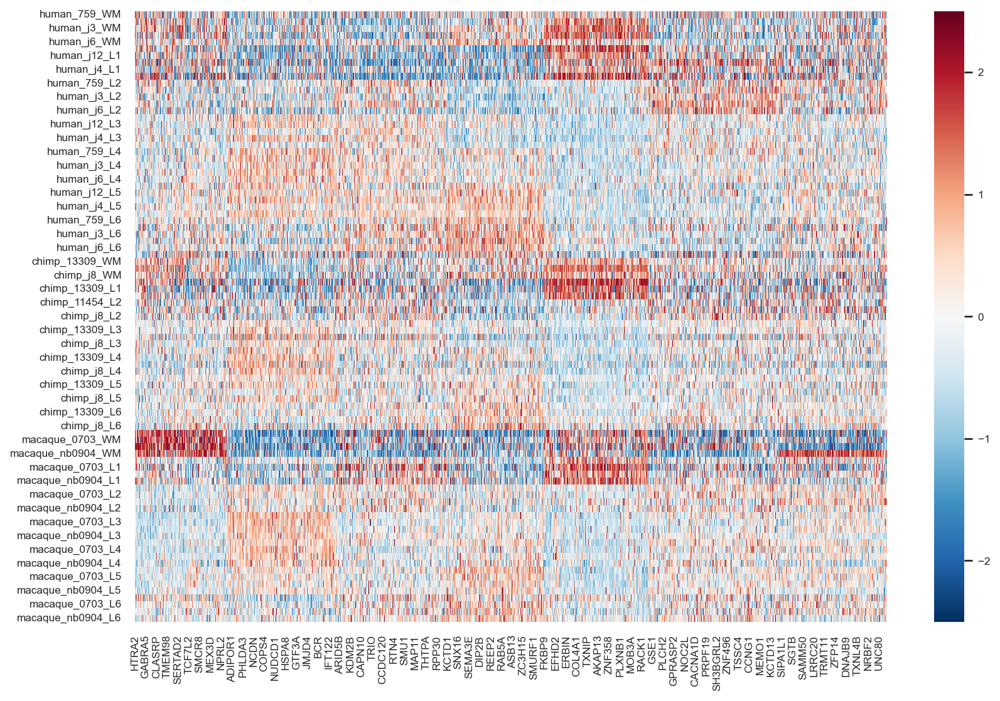

In [117]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)